## 2D Objection on [Waymo Open Dataset](https://waymo.com/open/about/)

## Data Extraction

In [1]:
# import tarfile
# import sys

# tf = tarfile.open("training_0000.tar")
# tf.extractall()

In [2]:
# !tf_upgrade_v2 --intree Mask_RCNN --inplace --reportfile report.txt
# !{sys.executable} -m pip install nms
# !git clone https://github.com/matterport/Mask_RCNN.git

In [3]:
import tensorflow.compat.v1 as tf
from waymo_open_dataset import dataset_pb2 as open_dataset

from tqdm import *
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from mrcnn.model import MaskRCNN

import tensorflow as tf
print(tf.__version__)

Using TensorFlow backend.


2.1.0


In [5]:
FILENAME = 'segment-10017090168044687777_6380_000_6400_000_with_camera_labels.tfrecord'
dataset = tf.data.TFRecordDataset(FILENAME, compression_type='')

images = []
labels = []
for data in dataset:
    frame = open_dataset.Frame()
    frame.ParseFromString(bytearray(data.numpy()))
    # load photograph
    # img = load_img('elephant.jpg')
    img = tf.image.decode_jpeg(frame.images[0].image).numpy()
    # make prediction
    images.append(img)
    labels.append([label for label in frame.camera_labels][0])

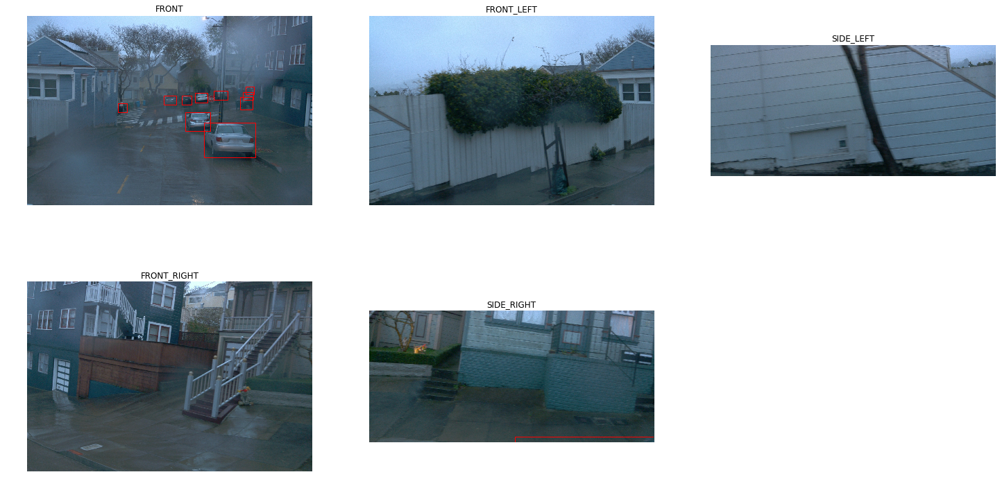

In [6]:
def show_camera_image(camera_image, camera_labels, layout, cmap=None):
  """Show a camera image and the given camera labels."""

  ax = plt.subplot(*layout)

  # Draw the camera labels.
  for camera_labels in frame.camera_labels:
    # Ignore camera labels that do not correspond to this camera.
    if camera_labels.name != camera_image.name:
      continue

    # Iterate over the individual labels.
    for label in camera_labels.labels:
      # Draw the object bounding box.
      ax.add_patch(patches.Rectangle(
        xy=(label.box.center_x - 0.5 * label.box.length,
            label.box.center_y - 0.5 * label.box.width),
        width=label.box.length,
        height=label.box.width,
        linewidth=1,
        edgecolor='red',
        facecolor='none'))

  # Show the camera image.
  plt.imshow(tf.image.decode_jpeg(camera_image.image), cmap=cmap)
  plt.title(open_dataset.CameraName.Name.Name(camera_image.name))
  plt.grid(False)
  plt.axis('off')

plt.figure(figsize=(25, 20))

for index, image in enumerate(frame.images):
  show_camera_image(image, frame.camera_labels, [3, 3, index+1])

In [7]:
# draw an image with detected objects
def draw_image_with_boxes(data, boxes_list):
     # load the image
#      data = pyplot.imread(filename)
     # plot the image
     pyplot.imshow(data)
     # get the context for drawing boxes
     ax = pyplot.gca()
     # plot each box
     for box in boxes_list:
          # get coordinates
          y1, x1, y2, x2 = box
          # calculate width and height of the box
          width, height = x2 - x1, y2 - y1
          # create the shape
          rect = Rectangle((x1, y1), width, height, fill=False, color='red')
          # draw the box
          ax.add_patch(rect)
     # show the plot
     pyplot.show()

## Mask RCNN Model

In [8]:
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from mrcnn.config import Config
from mrcnn.model import MaskRCNN
from matplotlib import pyplot
from matplotlib.patches import Rectangle
 
# define the test configuration
class TestConfig(Config):
    NAME = "test"
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 1 + 80

# define the model
rcnn = MaskRCNN(mode='inference', model_dir='./', config=TestConfig())
# load coco model weights
rcnn.load_weights('mask_rcnn_coco.h5', by_name=True)

## Evaluation

In [9]:
def bb_intersection_over_union(boxA, boxB):
    # determine the (x, y)-coordinates of the intersection rectangle
    xA = max(boxA[0], boxB[0])
    yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2])
    yB = min(boxA[3], boxB[3])

    # compute the area of intersection rectangle
    interArea = abs(max((xB - xA, 0)) * max((yB - yA), 0))
    if interArea == 0:
        return 0
    # compute the area of both the prediction and ground-truth
    # rectangles
    boxAArea = abs((boxA[2] - boxA[0]) * (boxA[3] - boxA[1]))
    boxBArea = abs((boxB[2] - boxB[0]) * (boxB[3] - boxB[1]))

    # compute the intersection over union by taking the intersection
    # area and dividing it by the sum of prediction + ground-truth
    # areas - the interesection area
    iou = interArea / float(boxAArea + boxBArea - interArea)

    # return the intersection over union value
    return iou

In [46]:
results = []
for image in tqdm(images[:25]):
    results.append(rcnn.detect([image], verbose=0))

100%|██████████| 25/25 [02:51<00:00,  6.88s/it]


In [11]:
predictions = [res[0]['rois'].tolist() for res in results]

In [12]:
ground_truths = []
for lb in labels:
    boxes = []
    for box in lb.labels:
        label = box.box
        x0 = label.center_x - (label.width/2)
        x1 = label.center_x + (label.width/2)
        y0 = label.center_y - (label.length/2)
        y1 = label.center_y + (label.length/2)

        boxes.append([y0, x0, y1, x1])
    ground_truths.append(boxes)
    
len(ground_truths)

198

In [13]:
predict_flags = []
precisions = []
for i, boxes in enumerate(ground_truths[:25]):
    predict_flag = [0]*len(boxes)
    for j, box in enumerate(boxes):
        results = []
        for prediction in predictions[i]:
            iou = bb_intersection_over_union(box, prediction)
            if iou > 0.5:
                results.append(iou)
        if results and max(results) > 0.5:
            predict_flag[j] = 1
    predict_flags.append(predict_flag)
    precisions.append(np.mean(predict_flag))

In [14]:
np.mean(precisions)

0.2187965367965368

#### Ground Truth

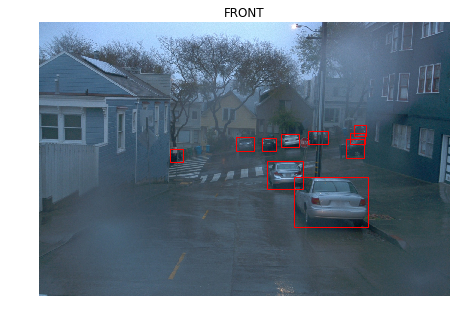

In [15]:
plt.figure(figsize=(25, 20))
show_camera_image(frame.images[0], frame.camera_labels, [3, 3, index+1])

#### Prediction

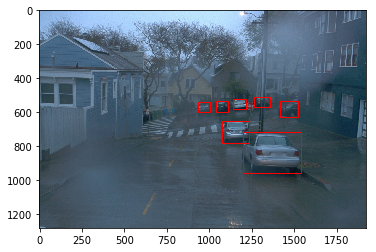

In [28]:
import tensorflow.compat.v1 as tf


res = rcnn.detect([tf.image.decode_jpeg(frame.images[0].image).numpy()])

# visualize the results
draw_image_with_boxes(img, res[0]['rois'])

## SVM Model

In [34]:
with open('svm_model.model', 'rb') as f:
    d = pickle.load(f, encoding='latin1') 

/home/ec2-user/anaconda3/envs/python-gpu/lib/python3.7/site-packages/sklearn/base.py:251: UserWarning: Trying to unpickle estimator LinearSVC from version 0.20.3 when using version 0.20.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


In [38]:
import numpy as np 
#from skimage import transform
from skimage.transform import pyramid_gaussian
from imutils.object_detection import non_max_suppression
import imutils
from skimage.feature import hog
from sklearn.externals import joblib
import cv2
#from config import *
from skimage import color
import matplotlib.pyplot as plt 
import os 
import glob
import pickle

pos_im_path = 'C:\\Users\\Richa Agrawal\\Desktop\\computer vision\\video\\re-svm\\data\\images\\pos_person'
neg_im_path = 'C:\\Users\\Richa Agrawal\\Desktop\\computer vision\\video\\re-svm\\data\\images\\neg_person'
min_wdw_sz = [64, 128]
step_size = [10,10]
orientations = 9
pixels_per_cell = [6,6]
cells_per_block = [2, 2]
visualize = False
normalize = True
pos_feat_ph = 'C:\\Users\\Richa Agrawal\\Desktop\\computer vision\\video\\re-svm\\data\\features\\pos'
neg_feat_ph = 'C:\\Users\\Richa Agrawal\\Desktop\\computer vision\\video\\re-svm\\data\\features\\neg'
model_path = 'C:\\Users\\Richa Agrawal\\Desktop\\computer vision\\video\\re-svm\\data\\models'
threshold = .3
 

def sliding_window(image, window_size, step_size):
    '''
    This function returns a patch of the input 'image' of size 
    equal to 'window_size'. The first image returned top-left 
    co-ordinate (0, 0) and are increment in both x and y directions
    by the 'step_size' supplied.
    So, the input parameters are-
    image - Input image
    window_size - Size of Sliding Window 
    step_size - incremented Size of Window
    The function returns a tuple -
    (x, y, im_window)
    '''
    for y in range(0, image.shape[0], step_size[1]):
        for x in range(0, image.shape[1], step_size[0]):
            yield (x, y, image[y: y + window_size[1], x: x + window_size[0]])

def detector(im):
#     im = cv2.imread(filename)
    im = imutils.resize(im, width = min(400, im.shape[1]))
    min_wdw_sz = (64, 128)
    step_size = (10, 10)
    downscale = 1.6
   
    clf = d

    #List to store the detections
    detections = []
    #The current scale of the image 
    scale = 0

    for im_scaled in pyramid_gaussian(im, downscale = downscale):
        #The list contains detections at the current scale
        if im_scaled.shape[0] < min_wdw_sz[1] or im_scaled.shape[1] < min_wdw_sz[0]:
            break
        for (x, y, im_window) in sliding_window(im_scaled, min_wdw_sz, step_size):
            if im_window.shape[0] != min_wdw_sz[1] or im_window.shape[1] != min_wdw_sz[0]:
                continue
#             im_window = color.rgb2gray(im_window)
            fd =  hog(im_window, orientations=9, pixels_per_cell=(6, 6),cells_per_block=(2, 2),block_norm='L1',transform_sqrt=False,feature_vector=True)
            fd = fd.reshape(1, -1)
            pred = clf.predict(fd)

            if pred == 1:
                
                if clf.decision_function(fd) > 0.5:
                    detections.append((int(x * (downscale**scale)), int(y * (downscale**scale)), clf.decision_function(fd), int(min_wdw_sz[0] * (downscale**scale)),int(min_wdw_sz[1] * (downscale**scale))))
                 

            
        scale += 1

    clone = im.copy()



    rects = np.array([[x, y, x + w, y + h] for (x, y, _, w, h) in detections])
    sc = [score[0] for (x, y, score, w, h) in detections]
    print ("sc: ", sc)
    sc = np.array(sc)
    pick = non_max_suppression(rects, probs = sc, overlapThresh = 0.3)
    #print ("shape, ", pick.shape)
   
    for (x_tl, y_tl, _, w, h) in detections:
        cv2.rectangle(im, (x_tl, y_tl), (x_tl + w, y_tl + h), (0, 255, 0), thickness = 2)
    for(xA, yA, xB, yB) in pick:
        cv2.rectangle(clone, (xA, yA), (xB, yB), (0, 255, 0), 2)
    
    plt.axis("off")
    plt.imshow(cv2.cvtColor(im, cv2.COLOR_BGR2RGB))
    plt.title("Raw Detection before NMS")
    plt.show()

    plt.axis("off")
    plt.imshow(cv2.cvtColor(clone, cv2.COLOR_BGR2RGB))
    plt.title("Final Detections after applying NMS")
    plt.show()
    
    return yA,xA, yB, xB

def test_folder(foldername):

    filenames = glob.glob(os.path.join(foldername, '*'))
    for filename in filenames:
        detector(filename)




sc:  []


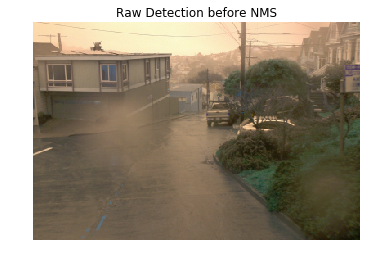

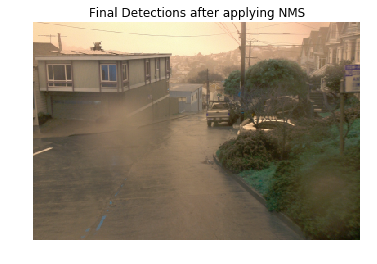

sc:  []


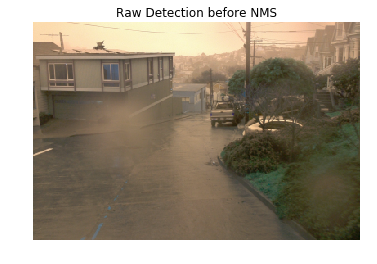

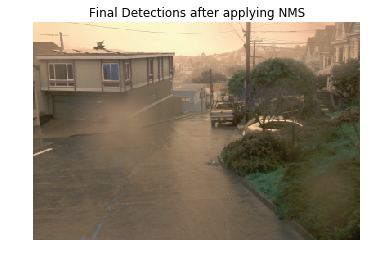

sc:  []


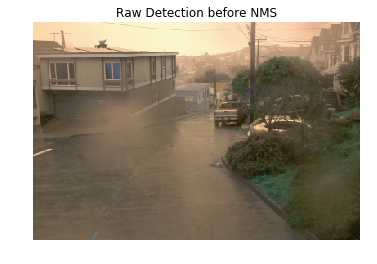

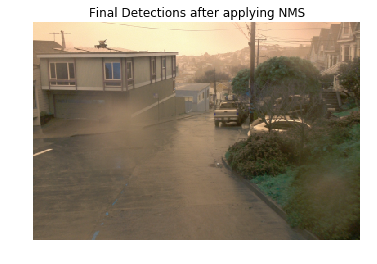

sc:  [0.5449117529117502]


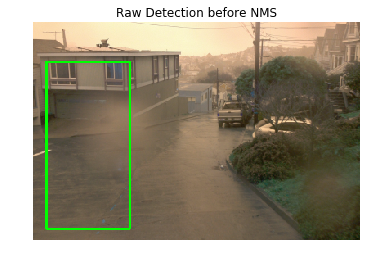

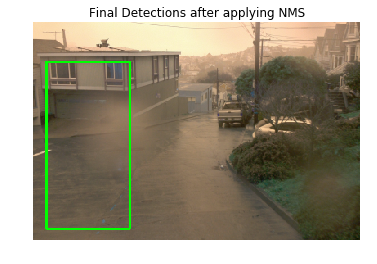

sc:  []


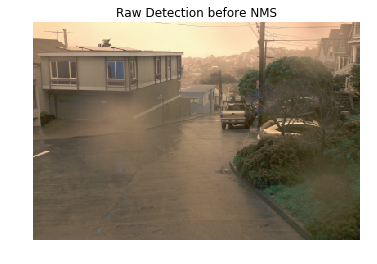

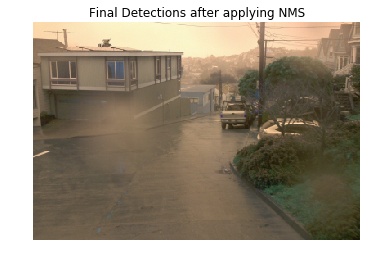

sc:  []


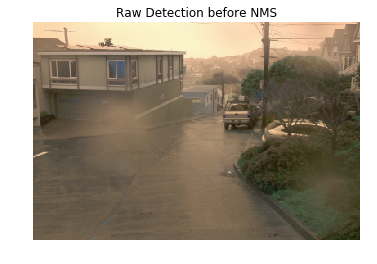

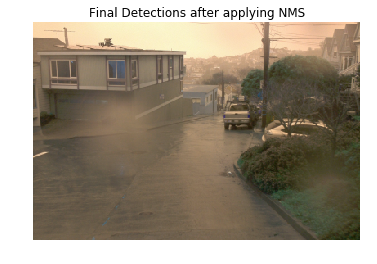

sc:  [0.877207532673079]


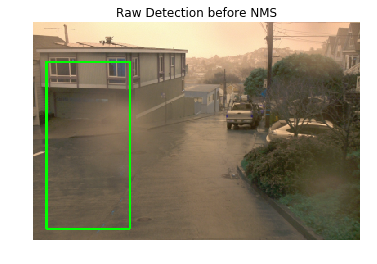

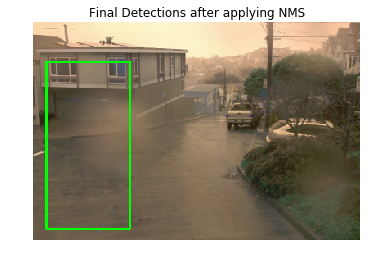

sc:  []


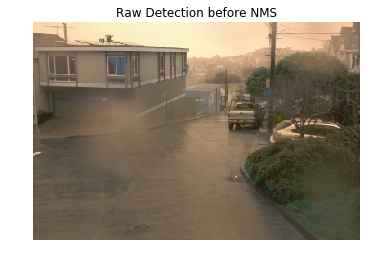

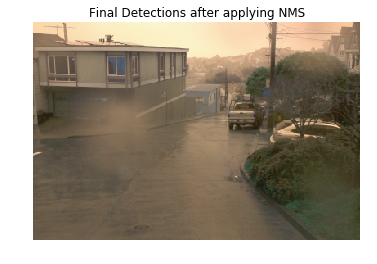

sc:  []


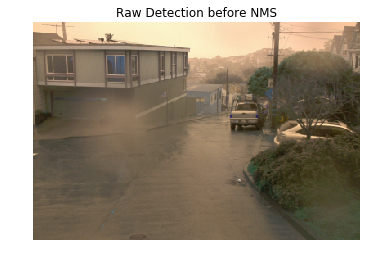

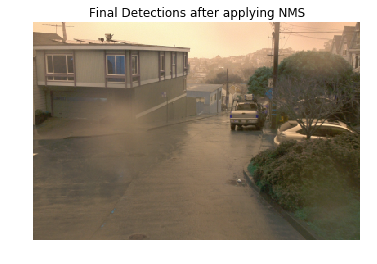

sc:  []


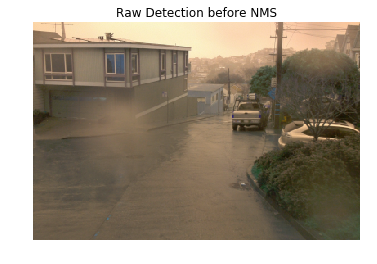

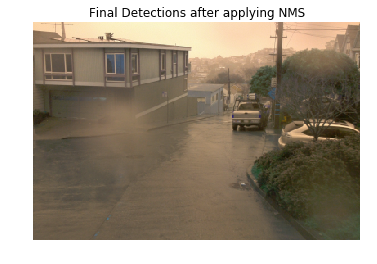

sc:  [0.5071231842222574]


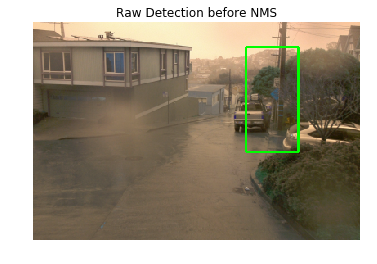

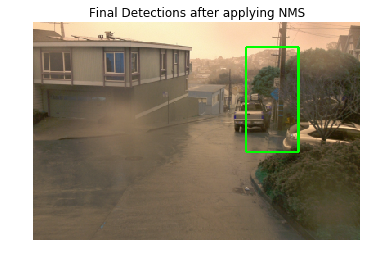

sc:  [0.6335010037739384]


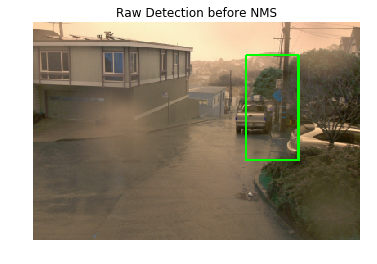

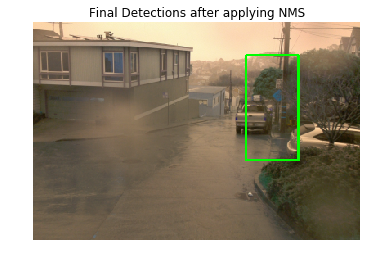

sc:  []


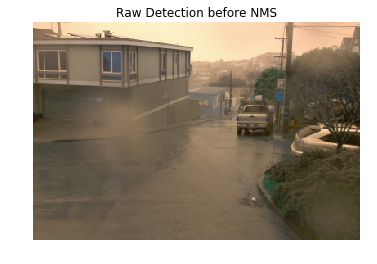

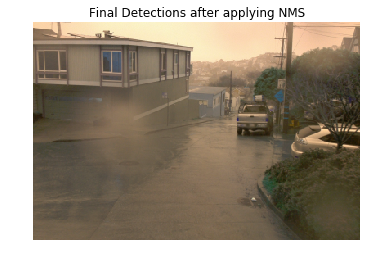

sc:  []


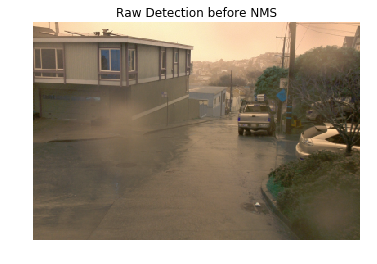

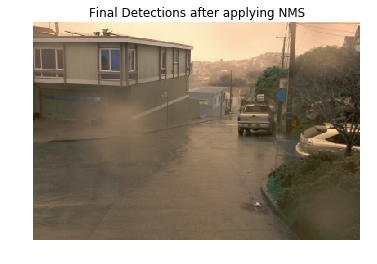

sc:  [0.6228457391007727]


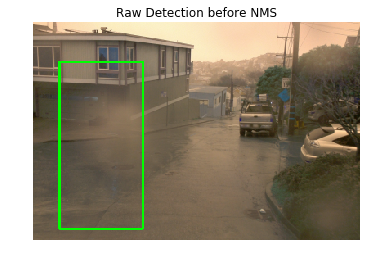

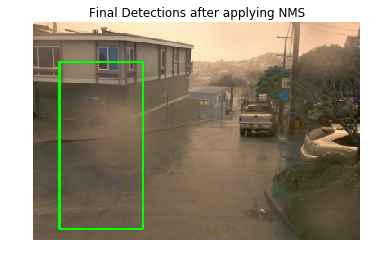

sc:  [0.8678701178477537]


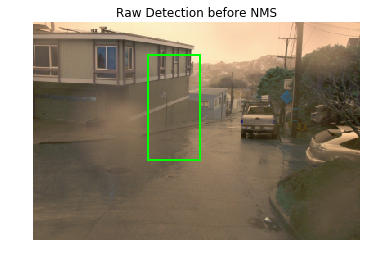

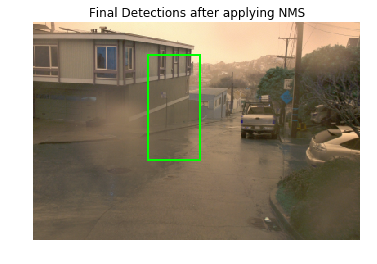

sc:  [0.5593036174510102, 0.5725532614902324, 0.6537050006295815]


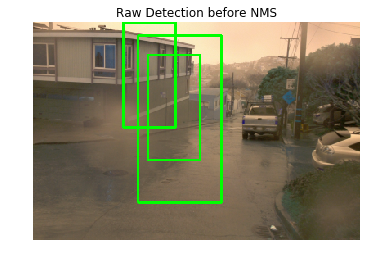

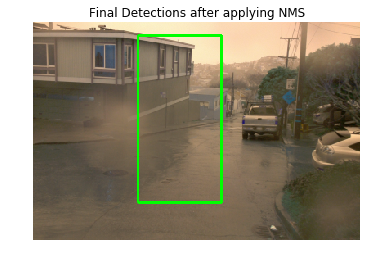

sc:  [0.7219387625243658, 0.8201340920714943]


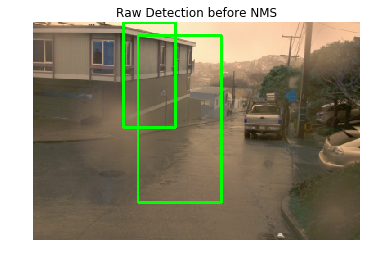

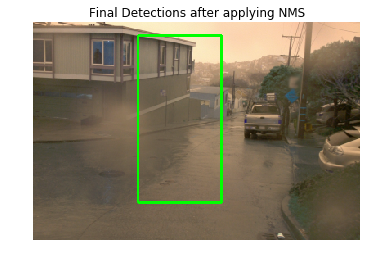

sc:  [0.6509283053138815]


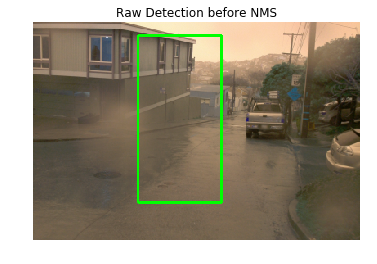

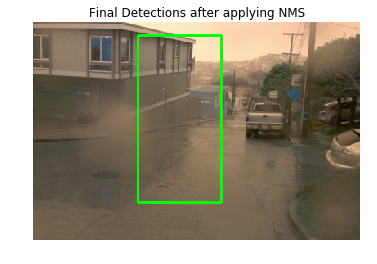

sc:  [0.9716563775155764]


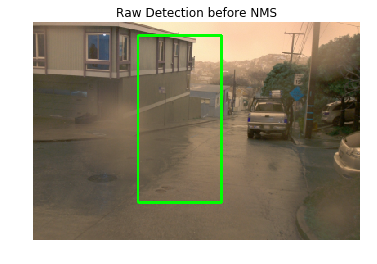

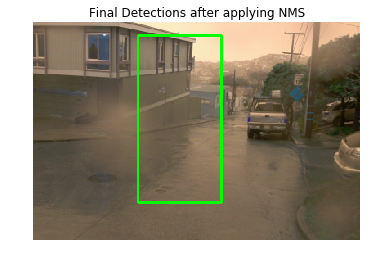

sc:  [0.7127258588915033]


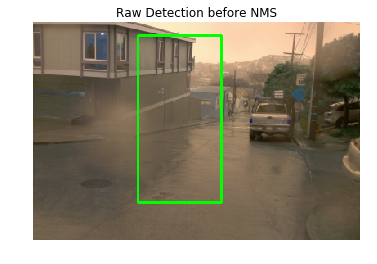

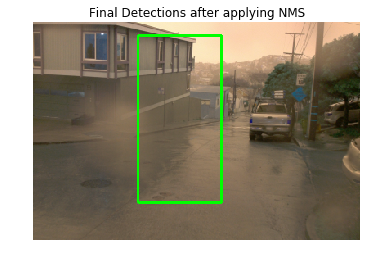

sc:  [0.6180214482359654]


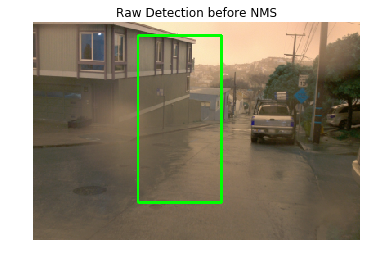

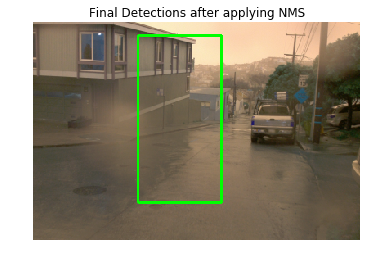

sc:  []


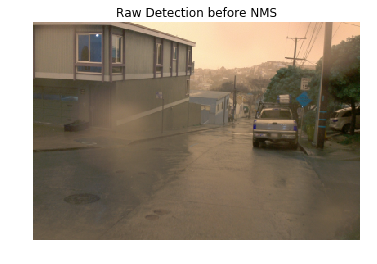

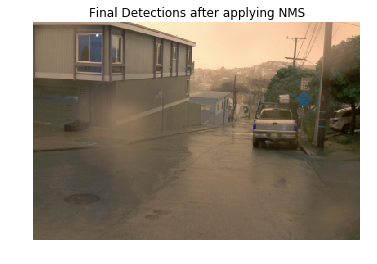

sc:  []


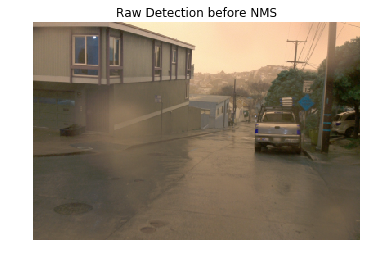

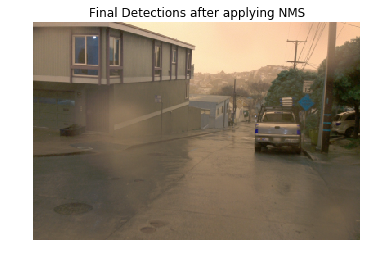

sc:  []


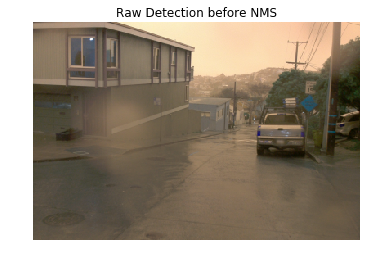

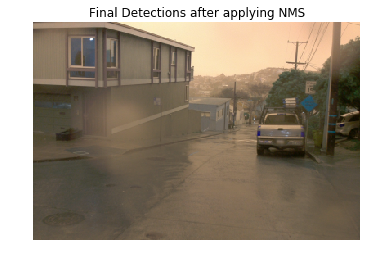

In [39]:
boxes = []
for i in range(25):
    box=[0,0,0,0]
    try:
        box = detector(images[i])
        boxes.append([list(box)])
    except:
        boxes.append([box])
        continue

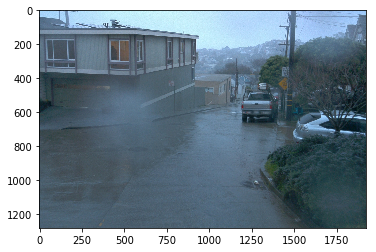

In [31]:
plt.imshow(images[11])

sc:  [0.6335010037739384]


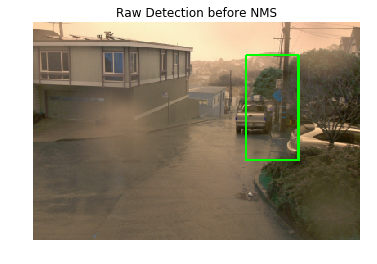

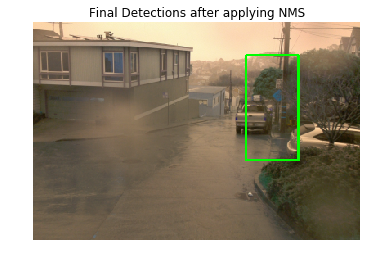

(40, 260, 168, 324)

In [40]:
detector(images[11])

In [44]:
svm_boxes = boxes

predict_flags = []
precisions = []
for i, boxes in enumerate(ground_truths[:25]):
    predict_flag = [0]*len(boxes)
    for j, box in enumerate(boxes):
        results = []
        for prediction in svm_boxes:
            iou = bb_intersection_over_union(box, prediction)
            if iou > 0.5:
                results.append(iou)
        if results and max(results) > 0.5:
            predict_flag[j] = 1
    predict_flags.append(predict_flag)
    precisions.append(np.mean(predict_flag))
    
np.mean(precisions)

0.08

### SOFT NSM + Mask RCNN

In [48]:
import numpy as np
import tensorflow as tf
from keras import backend as K
import time


def py_cpu_softnms(dets, sc, Nt=0.3, sigma=0.5, thresh=0.001, method=2):
    """
    py_cpu_softnms
    :param dets:   boexs 坐标矩阵 format [y1, x1, y2, x2]
    :param sc:     每个 boxes 对应的分数
    :param Nt:     iou 交叠门限
    :param sigma:  使用 gaussian 函数的方差
    :param thresh: 最后的分数门限
    :param method: 使用的方法
    :return:       留下的 boxes 的 index
    """

    # indexes concatenate boxes with the last column
    N = dets.shape[0]
    indexes = np.array([np.arange(N)])
    dets = np.concatenate((dets, indexes.T), axis=1)

    # the order of boxes coordinate is [y1,x1,y2,x2]
    y1 = dets[:, 0]
    x1 = dets[:, 1]
    y2 = dets[:, 2]
    x2 = dets[:, 3]
    scores = sc
    areas = (x2 - x1 + 1) * (y2 - y1 + 1)

    for i in range(N):
        # intermediate parameters for later parameters exchange
        tBD = dets[i, :].copy()
        tscore = scores[i].copy()
        tarea = areas[i].copy()
        pos = i + 1

        #
        if i != N-1:
            maxscore = np.max(scores[pos:], axis=0)
            maxpos = np.argmax(scores[pos:], axis=0)
        else:
            maxscore = scores[-1]
            maxpos = 0
        if tscore < maxscore:
            dets[i, :] = dets[maxpos + i + 1, :]
            dets[maxpos + i + 1, :] = tBD
            tBD = dets[i, :]

            scores[i] = scores[maxpos + i + 1]
            scores[maxpos + i + 1] = tscore
            tscore = scores[i]

            areas[i] = areas[maxpos + i + 1]
            areas[maxpos + i + 1] = tarea
            tarea = areas[i]

        # IoU calculate
        xx1 = np.maximum(dets[i, 1], dets[pos:, 1])
        yy1 = np.maximum(dets[i, 0], dets[pos:, 0])
        xx2 = np.minimum(dets[i, 3], dets[pos:, 3])
        yy2 = np.minimum(dets[i, 2], dets[pos:, 2])

        w = np.maximum(0.0, xx2 - xx1 + 1)
        h = np.maximum(0.0, yy2 - yy1 + 1)
        inter = w * h
        ovr = inter / (areas[i] + areas[pos:] - inter)

        # Three methods: 1.linear 2.gaussian 3.original NMS
        if method == 1:  # linear
            weight = np.ones(ovr.shape)
            weight[ovr > Nt] = weight[ovr > Nt] - ovr[ovr > Nt]
        elif method == 2:  # gaussian
            weight = np.exp(-(ovr * ovr) / sigma)
        else:  # original NMS
            weight = np.ones(ovr.shape)
            weight[ovr > Nt] = 0

        scores[pos:] = weight * scores[pos:]

    # select the boxes and keep the corresponding indexes
    inds = dets[:, 4][scores > thresh]
    keep = inds.astype(int)

    return keep


def speed():
    boxes = 1000*np.random.rand((1000, 100, 4))
    boxscores = np.random.rand((1000, 100))

    start = time.time()
    for i in range(1000):
        py_cpu_softnms(boxes[i], boxscores[i], method=2)
    end = time.time()
    print("Average run time: %f ms" % (end-start))



    
    
    

In [58]:
results[0][0]['rois']

array([[ 548, 1196,  655, 1552],
       [ 457, 1016,  614, 1194]], dtype=int32)

In [62]:
soft_nims_boxes = []
for result in results:
    # boxes and scores
    boxes = result[0]['rois']#np.array([[200, 200, 400, 400], [220, 220, 420, 420], [200, 240, 400, 440], [240, 200, 440, 400], [1, 1, 2, 2]], dtype=np.float32)
    boxscores = result[0]['scores'] #np.array([0.9, 0.8, 0.7, 0.6, 0.5], dtype=np.float32)

    # tf.image.non_max_suppression 中 boxes 是 [y1,x1,y2,x2] 排序的。
    with tf.compat.v1.Session() as sess:
        # index = sess.run(tf.image.non_max_suppression(boxes=boxes, scores=boxscores, iou_threshold=0.5, max_output_size=5))
        # print(index)
        index = py_cpu_softnms(boxes, boxscores, method=3)
        selected_boxes = sess.run(K.gather(boxes, index))
    soft_nims_boxes.append(selected_boxes)
    

In [63]:
len(soft_nims_boxes)

25

In [69]:
predict_flags = []
precisions = []
for i, boxes in enumerate(ground_truths[:25]):
    predict_flag = [0]*len(boxes)
    for j, box in enumerate(boxes):
        results = []
        for prediction in soft_nims_boxes[i]:
            iou = bb_intersection_over_union(box, prediction)
            if iou > 0.5:
                results.append(iou)
        if results and max(results) > 0.5:
            predict_flag[j] = 1
    predict_flags.append(predict_flag)
    precisions.append(np.mean(predict_flag))

In [70]:
np.mean(precisions)

0.2187965367965368